## 安裝必要套件

✅ **磁碟空間已清理完成 (17GB 可用)**

執行下方 cell 安裝訓練所需套件（約需 5-10 分鐘）

In [33]:
# 檢查並安裝必要套件
import subprocess
import sys

def check_and_install():
    # 先檢查套件是否已安裝
    try:
        import torch
        import ultralytics
        print("✓ torch 已安裝:", torch.__version__)
        print("✓ ultralytics 已安裝:", ultralytics.__version__)
        return True
    except ImportError:
        pass
    
    # 需要安裝
    print("開始安裝套件...")
    print("注意：這可能需要 5-10 分鐘，請耐心等待")
    
    try:
        # 使用系統 pip 安裝到當前 kernel
        result = subprocess.run(
            [sys.executable, "-m", "pip", "install", "torch", "torchvision", "ultralytics", 
             "--default-timeout=300", "--no-cache-dir"],
            capture_output=True,
            text=True,
            timeout=6000
        )
        
        if result.returncode == 0:
            print("✓ 安裝完成！")
            return True
        else:
            print("✗ 安裝失敗:")
            print(result.stderr[:500])
            return False
    except Exception as e:
        print(f"✗ 安裝錯誤: {e}")
        return False

check_and_install()

✓ torch 已安裝: 2.4.1+cu121
✓ ultralytics 已安裝: 8.3.232


True

## 訓練前檢查

執行以下 cells 確認環境準備就緒

In [34]:
# 1. 檢查 GPU 狀態
import torch
import subprocess

print("=" * 50)
print("GPU 狀態檢查")
print("=" * 50)

# CUDA 可用性
cuda_available = torch.cuda.is_available()
print(f"✓ CUDA 可用: {cuda_available}")

if cuda_available:
    print(f"✓ GPU 名稱: {torch.cuda.get_device_name(0)}")
    print(f"✓ GPU 數量: {torch.cuda.device_count()}")
    
    # 顯示記憶體資訊
    gpu_mem = subprocess.check_output(
        ['nvidia-smi', '--query-gpu=memory.used,memory.total,memory.free', '--format=csv,noheader,nounits'],
        encoding='utf-8'
    ).strip().split(',')
    
    used_mb = int(gpu_mem[0].strip())
    total_mb = int(gpu_mem[1].strip())
    free_mb = int(gpu_mem[2].strip())
    
    print(f"✓ GPU 記憶體: {used_mb} MB / {total_mb} MB (可用: {free_mb} MB)")
    
    if free_mb < 2000:
        print("⚠ 警告: 可用記憶體不足 2GB，可能需要降低 batch size")
    else:
        print("✓ 記憶體充足，可以開始訓練！")
else:
    print("✗ CUDA 不可用，將使用 CPU 訓練（速度會很慢）")

GPU 狀態檢查
✓ CUDA 可用: True
✓ GPU 名稱: NVIDIA GeForce RTX 3090 Ti
✓ GPU 數量: 1
✓ GPU 記憶體: 846 MB / 24564 MB (可用: 23304 MB)
✓ 記憶體充足，可以開始訓練！
✓ GPU 記憶體: 846 MB / 24564 MB (可用: 23304 MB)
✓ 記憶體充足，可以開始訓練！


In [54]:
# 2. 檢查資料集
import os

print("=" * 50)
print("資料集檢查")
print("=" * 50)

# 檢查資料夾
train_img_dir = "./datasets/train/images"
train_label_dir = "./datasets/train/labels"
val_img_dir = "./datasets/val/images"        # ✅ 修正：驗證集在 datasets/val
val_label_dir = "./datasets/val/labels"      # ✅ 修正：驗證集在 datasets/val
yaml_file = "./aortic_valve_colab.yaml"

checks = [
    (train_img_dir, "訓練影像"),
    (train_label_dir, "訓練標籤"),
    (val_img_dir, "驗證影像"),
    (val_label_dir, "驗證標籤"),
    (yaml_file, "YAML 配置檔"),
]

all_ok = True
for path, name in checks:
    exists = os.path.exists(path)
    status = "✓" if exists else "✗"
    print(f"{status} {name}: {path}")
    if not exists:
        all_ok = False

if all_ok:
    # 計算資料數量
    train_count = len([f for f in os.listdir(train_img_dir) if f.endswith('.png')])
    val_count = len([f for f in os.listdir(val_img_dir) if f.endswith('.png')])
    
    print(f"\n✓ 訓練集: {train_count} 張")
    print(f"✓ 驗證集: {val_count} 張")
    print(f"✓ 總計: {train_count + val_count} 張")
    print("\n✓ 資料集準備完成，可以開始訓練！")
else:
    print("\n✗ 資料集檢查失敗，請先準備資料集")

資料集檢查
✓ 訓練影像: ./datasets/train/images
✓ 訓練標籤: ./datasets/train/labels
✓ 驗證影像: ./datasets/val/images
✓ 驗證標籤: ./datasets/val/labels
✓ YAML 配置檔: ./aortic_valve_colab.yaml

✓ 訓練集: 1631 張
✓ 驗證集: 1156 張
✓ 總計: 2787 張

✓ 資料集準備完成，可以開始訓練！


In [55]:
# 3. 檢查模型檔案和 Ultralytics
import sys

print("=" * 50)
print("套件和模型檔案檢查")
print("=" * 50)

# 檢查 ultralytics
try:
    from ultralytics import YOLO
    import ultralytics
    print(f"✓ Ultralytics 版本: {ultralytics.__version__}")
except ImportError:
    print("✗ Ultralytics 未安裝")
    print("請執行: pip install ultralytics")
    sys.exit(1)

# 檢查模型檔案
model_file = "yolo12n.pt"
if os.path.exists(model_file):
    file_size = os.path.getsize(model_file) / (1024 * 1024)
    print(f"✓ 模型檔案: {model_file} ({file_size:.1f} MB)")
else:
    print(f"✗ 模型檔案不存在: {model_file}")
    print("請確保模型檔案在當前目錄")

print("\n✓ 所有檢查通過，準備開始訓練！")

套件和模型檔案檢查
✓ Ultralytics 版本: 8.3.232
✓ 模型檔案: yolo12n.pt (5.3 MB)

✓ 所有檢查通過，準備開始訓練！


#### 1.設置環境

驗證環境是否正確

In [37]:
import sys, pkgutil
print("Python:", sys.executable)
print("ipykernel ok:", pkgutil.find_loader("ipykernel") is not None)

# 如需 GPU，附加測試（沒有 GPU 可忽略）
try:
    import torch
    print("Torch:", torch.__version__)
    print("CUDA available:", torch.cuda.is_available())
    if torch.cuda.is_available():
        print(torch.cuda.get_device_name(0))
except Exception as e:
    print("Torch import error:", e)


Python: /home/kann/aicup2/.venv/bin/python
ipykernel ok: True
Torch: 2.4.1+cu121
CUDA available: True
NVIDIA GeForce RTX 3090 Ti


確保不會出現編碼錯誤

In [38]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

下載YOLOv12套件

In [39]:
!pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.232 🚀 Python-3.8.10 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24149MiB)
Setup complete ✅ (36 CPUs, 251.4 GB RAM, 1824.9/1832.2 GB disk)
Setup complete ✅ (36 CPUs, 251.4 GB RAM, 1824.9/1832.2 GB disk)


#### 2. 上傳資料集和 .yaml 檔

.yaml 檔內容

.yaml 範例:https://drive.google.com/file/d/13hSr3sa2wOZqlvY1RAwr2msCfTdkfjMe/view?usp=sharing

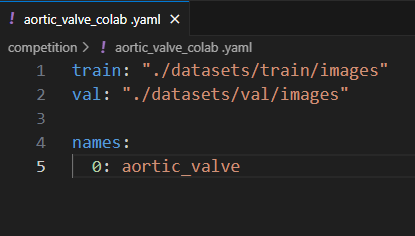



移動檔案(透過下方程式，執行時間<1分鐘)


此範例將前30筆資料用於訓練，後20筆資料用於驗證，參賽者可在程式中53行及56行更改比例

因為Colab運算資源有限此處只採用有標註檔的圖片，其餘圖片也可以自行修改程式利用

將前30筆資料的圖片全部移動至./datasets/train/images，


 前30筆資料的標註全部移動至./datasets/train/labels，


 後20筆資料的圖片全部移動至./datasets/val/images，


 後20筆資料的標註全部移動至./datasets/val/labels。


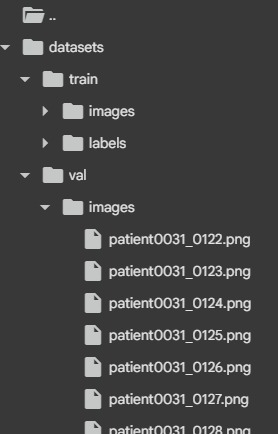

In [57]:
import os, zipfile, shutil

def unzip_if_needed(zip_path, dest_dir):
    if os.path.isdir(dest_dir):
        return
    if os.path.exists(zip_path):
        os.makedirs(dest_dir, exist_ok=True)
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(dest_dir)

def find_patient_root(root):
    for dirpath, dirnames, _ in os.walk(root):
        if any(d.startswith("patient") for d in dirnames):
            return dirpath
    return root

# 解壓縮（不使用外部 unzip 指令）
unzip_if_needed("training_image.zip", "./training_image")
unzip_if_needed("training_label.zip", "./training_label")

IMG_ROOT = find_patient_root("./training_image")
LBL_ROOT = find_patient_root("./training_label")

# 建立輸出資料夾
for p in ["./datasets/train/images","./datasets/train/labels",
          "./datasets/val/images","./datasets/val/labels"]:
    os.makedirs(p, exist_ok=True)

def move_patients(start, end, split):
    moved = 0
    for i in range(start, end + 1):
        patient = f"patient{i:04d}"
        img_dir = os.path.join(IMG_ROOT, patient)
        lbl_dir = os.path.join(LBL_ROOT, patient)
        if not (os.path.isdir(img_dir) and os.path.isdir(lbl_dir)):
            continue
        for fname in os.listdir(lbl_dir):
            if not fname.endswith(".txt"):
                continue
            base = os.path.splitext(fname)[0]
            img_path = os.path.join(img_dir, base + ".png")
            lbl_path = os.path.join(lbl_dir, base + ".txt")
            if not os.path.exists(img_path):
                continue
            dst_img = f"./datasets/{split}/images/{base}.png"
            dst_lbl = f"./datasets/{split}/labels/{base}.txt"
            if os.path.exists(dst_img): os.remove(dst_img)
            if os.path.exists(dst_lbl): os.remove(dst_lbl)
            shutil.move(img_path, dst_img)
            shutil.move(lbl_path, dst_lbl)
            moved += 1
    return moved

n_train = move_patients(1, 30, "train")
n_val   = move_patients(31, 50, "val")

print(f"完成移動：train {n_train} 筆，val {n_val} 筆")


完成移動：train 0 筆，val 0 筆


確認檔案是否成功移動


如果資料數量符合下圖數量代表移動成功

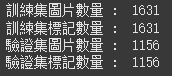

In [58]:
print('訓練集圖片數量 : ',len(os.listdir("./datasets/train/images")))
print('訓練集標記數量 : ',len(os.listdir("./datasets/train/labels")))
print('驗證集圖片數量 : ',len(os.listdir("./datasets/val/images")))
print('驗證集標記數量 : ',len(os.listdir("./datasets/val/labels")))

訓練集圖片數量 :  1631
訓練集標記數量 :  1631
驗證集圖片數量 :  1156
驗證集標記數量 :  1156


#### 3. 訓練模型

執行後依序有Epoch在跑代表成功

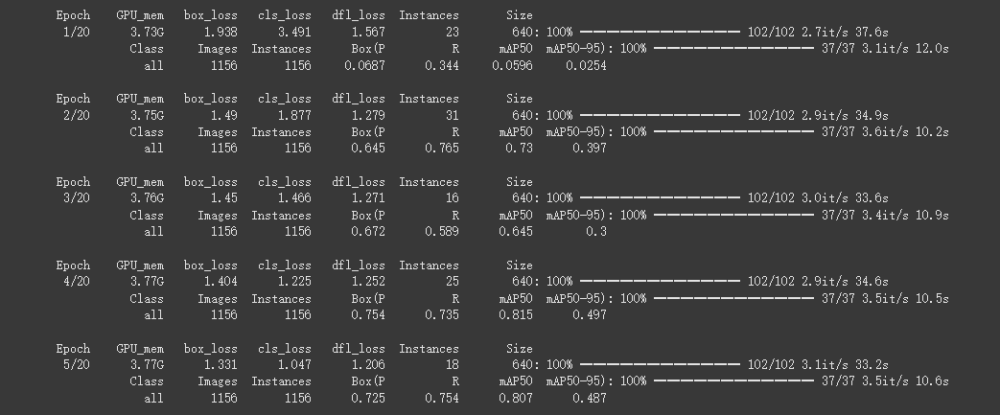

In [59]:
# ===== RTX 3090 Ti 優化版訓練 - 階段1：凍結骨幹快速訓練 =====
from ultralytics import YOLO

print("🚀 階段1開始：凍結骨幹訓練（12 epochs - 快速版）")
print("⚙️ RTX 3090 Ti (24GB) 快速配置：batch=24, 預計45分鐘")
model = YOLO('yolo12n.pt')  # 使用YOLOv12 nano預訓練模型
results = model.train(
    data="./aortic_valve_colab.yaml",
    epochs=12,              # ✅ 快速訓練：12 epochs
    batch=24,               # ✅ 增加到24（最大化GPU利用率）
    imgsz=640,
    device=0,
    freeze=10,              # ✅ 凍結前10層（骨幹網路）
    workers=8,              # ✅ 加快數據載入
    cache=True,             # ✅ 快取數據集到RAM（加快訓練）
    
    # 學習率設定（適合batch=24）
    lr0=0.01,               # ✅ 較大batch使用較大學習率
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    
    # 損失函數權重
    box=7.5,
    cls=0.5,
    dfl=1.5,
    
    # 完整數據增強（24GB記憶體足夠）
    hsv_h=0.015,            # 色調變化（醫學影像建議小幅度）
    hsv_s=0.7,              # 飽和度變化
    hsv_v=0.4,              # 亮度變化
    degrees=10.0,           # 旋轉±10度
    translate=0.1,          # 平移10%
    scale=0.5,              # 縮放±50%
    shear=0.0,              # 不使用剪切
    perspective=0.0,        # 不使用透視變換
    flipud=0.5,             # 上下翻轉50%
    fliplr=0.5,             # 左右翻轉50%
    mosaic=1.0,             # ✅ Mosaic增強
    mixup=0.0,              # ✅ 關閉Mixup（快速訓練）
    copy_paste=0.0,         # ✅ 關閉Copy-Paste（快速訓練）
    
    amp=True,               # 自動混合精度
    project='runs/detect',
    name='train_freeze'
)

🚀 階段1開始：凍結骨幹訓練（12 epochs - 快速版）
⚙️ RTX 3090 Ti (24GB) 快速配置：batch=24, 預計45分鐘
New https://pypi.org/project/ultralytics/8.3.233 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.232 🚀 Python-3.8.10 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24149MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=24, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./aortic_valve_colab.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=12, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, mom

In [2]:
# ===== RTX 3090 Ti 優化版訓練 - 階段2：解凍全模型精細訓練 =====
from ultralytics import YOLO  # ✅ 重新導入（Kernel重啟後需要）

print("\n🚀 階段2開始：解凍全模型微調（30 epochs - 穩定版）")
print("⚙️ RTX 3090 Ti (24GB) 穩定配置：batch=16, 預計2小時")
model = YOLO('./runs/detect/train_freeze4/weights/best.pt')  # 載入階段1的最佳權重
results = model.train(
    data="./aortic_valve_colab.yaml",
    epochs=30,              # ✅ 快速訓練：30 epochs（總計42 epochs）
    batch=16,               # ✅ 降低到16避免OOM（階段2需要更多記憶體）
    imgsz=640,
    device=0,
    freeze=0,               # ✅ 解凍所有層
    workers=4,              # ✅ 降低到4避免衝突
    cache=False,            # ✅ 關閉快取避免RAM不足
    patience=15,            # ✅ 早停機制：15 epochs無改善則停止
    
    # 較小學習率微調
    lr0=0.001,              # ✅ 微調階段使用較小學習率
    lrf=0.001,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    
    # 損失函數權重
    box=7.5,
    cls=0.5,
    dfl=1.5,
    
    # 相同的完整數據增強
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
    degrees=10.0, translate=0.1, scale=0.5,
    shear=0.0, perspective=0.0,
    flipud=0.5, fliplr=0.5,
    mosaic=1.0, mixup=0.0, copy_paste=0.0,
    
    amp=True,               # 自動混合精度
    project='runs/detect',
    name='train_unfreeze'
)

print("✅ 階段2完成！最終權重已保存至: ./runs/detect/train_unfreeze/weights/best.pt")
print("\n📊 請查看以下文件來評估訓練效果：")
print("   1. ./runs/detect/train_unfreeze/results.csv （查看mAP指標）")
print("   2. ./runs/detect/train_unfreeze/results.png （視覺化訓練曲線）")
print("   3. ./runs/detect/train_unfreeze/confusion_matrix.png （混淆矩陣）")


🚀 階段2開始：解凍全模型微調（30 epochs - 穩定版）
⚙️ RTX 3090 Ti (24GB) 穩定配置：batch=16, 預計2小時
New https://pypi.org/project/ultralytics/8.3.233 available 😃 Update with 'pip install -U ultralytics'
New https://pypi.org/project/ultralytics/8.3.233 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.232 🚀 Python-3.8.10 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24149MiB)
Ultralytics 8.3.232 🚀 Python-3.8.10 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24149MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./aortic_valve_colab.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=0, half=Fa

### 🚀 進階優化方案（針對 RTX 3090 Ti 24GB）

**策略1：使用更大的模型** - YOLOv12s/m 替代 nano
**策略2：延長訓練** - 更多 epochs 讓模型充分學習
**策略3：優化學習率** - 調整階段2學習率避免崩潰
**策略4：增強數據增強** - 啟用 mixup, copy_paste
**策略5：TTA預測** - Test Time Augmentation 提升推理精度

In [44]:
# ===== 🏆 高分優化方案 - 單階段完整訓練 =====
from ultralytics import YOLO

print("🚀 開始高分優化訓練")
print("⚙️ RTX 3090 Ti (24GB) - 使用 YOLOv12s 模型")
print("⏱️ 預計時間：3-4小時")

# 使用更大的模型以獲得更好的精度
model = YOLO('yolo12s.pt')  # small 模型（比 nano 更強，但仍適合24GB）

results = model.train(
    data="./aortic_valve_colab.yaml",
    
    # 訓練設定（單階段完整訓練）
    epochs=100,             # ✅ 充足的訓練時間
    batch=16,               # ✅ YOLOv12s 適合的 batch size
    imgsz=640,
    device=0,
    workers=8,
    cache=True,             # ✅ 快取數據加速
    
    # 學習率策略（關鍵！）
    lr0=0.01,               # ✅ 初始學習率
    lrf=0.01,               # ✅ 最終學習率（保持較高避免崩潰）
    cos_lr=True,            # ✅ 使用餘弦學習率調度
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=5.0,      # ✅ 更長的預熱期
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    
    # 早停策略
    patience=20,            # ✅ 20 epochs 無改善才停止
    
    # 損失函數權重
    box=7.5,
    cls=0.5,
    dfl=1.5,
    
    # 完整數據增強（充分利用24GB記憶體）
    hsv_h=0.015,            # 色調變化
    hsv_s=0.7,              # 飽和度變化
    hsv_v=0.4,              # 亮度變化
    degrees=15.0,           # ✅ 增加旋轉角度
    translate=0.2,          # ✅ 增加平移範圍
    scale=0.9,              # ✅ 增加縮放範圍
    shear=5.0,              # ✅ 輕微剪切
    perspective=0.0001,     # ✅ 輕微透視變換
    flipud=0.5,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.15,             # ✅ 啟用 Mixup（提升泛化能力）
    copy_paste=0.1,         # ✅ 啟用 Copy-Paste（增加樣本多樣性）
    
    # 進階設定
    amp=True,               # 混合精度
    close_mosaic=10,        # 最後10個epoch關閉mosaic
    
    project='runs/detect',
    name='train_best'
)

print("\n✅ 高分優化訓練完成！")
print(f"📊 最佳權重: ./runs/detect/train_best/weights/best.pt")
print(f"📈 訓練曲線: ./runs/detect/train_best/results.png")

🚀 開始高分優化訓練
⚙️ RTX 3090 Ti (24GB) - 使用 YOLOv12s 模型
⏱️ 預計時間：3-4小時
New https://pypi.org/project/ultralytics/8.3.233 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.232 🚀 Python-3.8.10 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24149MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=./aortic_valve_colab.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=yolo12s.pt, momentum=0.9

### 📈 預測時的優化技巧（TTA - Test Time Augmentation）

In [3]:
# ===== 🎯 高精度預測（使用 TTA） =====
from ultralytics import YOLO

# 載入最佳模型（使用階段2訓練完成的權重）
model = YOLO('./runs/detect/train_unfreeze4/weights/best.pt')  # ✅ 使用最新訓練的權重

# TTA預測（多角度預測後取平均，提升精度）
results = model.predict(
    source="./datasets/test/images/",
    save=True,
    imgsz=640,
    device=0,
    
    # TTA 設定
    augment=True,           # ✅ 啟用測試時數據增強
    
    # 進階設定
    conf=0.25,              # ✅ 置信度閾值（可調整 0.1-0.5）
    iou=0.45,               # ✅ NMS IoU閾值
    max_det=300,            # 最大檢測數量
    
    # 性能優化
    half=True,              # ✅ FP16推理（更快）
    
    project='runs/detect',
    name='predict_tta'
)

print("✅ TTA預測完成！")
print("📁 結果保存於: ./runs/detect/predict_tta/")


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment ma

訓練完左方檔案會有run資料夾，此份ipynb主要目標是得到best.pt用於進行預測!

(!!如果有重複訓練**請下載最後成功**的train編號資料夾)

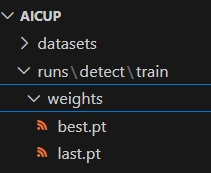

 #### 4. 資料集處理


In [4]:
import os, zipfile, shutil

def unzip_if_needed(zip_path, dest_dir):
    if os.path.isdir(dest_dir):
        return
    if os.path.exists(zip_path):
        os.makedirs(dest_dir, exist_ok=True)
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(dest_dir)

def find_patient_root(root):
    for dirpath, dirnames, _ in os.walk(root):
        if any(d.lower().startswith("patient") for d in dirnames):
            return dirpath
    return root

# 建立輸出資料夾
DST_TEST = "./datasets/test/images"
os.makedirs(DST_TEST, exist_ok=True)

# 檢查可能的測試資料來源
possible_sources = [
    "./testing_image",
    "./42_testing_image",
    "./42_testing_image/testing_image",
    "testing_image.zip"
]

TEST_ROOT = None
for source in possible_sources:
    if os.path.exists(source):
        if source.endswith('.zip'):
            unzip_if_needed(source, "./testing_image")
            TEST_ROOT = find_patient_root("./testing_image")
        else:
            TEST_ROOT = find_patient_root(source)
        break

if TEST_ROOT is None:
    print("⚠️ 測試資料集不存在，跳過此步驟")
    print(f"如果需要預測，請將測試資料放在以下任一位置：")
    for s in possible_sources:
        print(f"  - {s}")
else:
    # 收集所有圖片路徑（只看直屬的 patient 資料夾）
    all_files = []
    for patient_folder in os.listdir(TEST_ROOT):
        patient_path = os.path.join(TEST_ROOT, patient_folder)
        if os.path.isdir(patient_path) and patient_folder.lower().startswith("patient"):
            for fname in os.listdir(patient_path):
                if fname.lower().endswith(".png"):
                    all_files.append(os.path.join(patient_path, fname))

    # 按名稱排序並複製
    all_files.sort()
    copied = 0
    for f in all_files:
        dst = os.path.join(DST_TEST, os.path.basename(f))
        if os.path.exists(dst): os.remove(dst)  # 不想覆蓋就刪掉這行
        shutil.copy2(f, dst)
        copied += 1

    print(f"來源根目錄：{TEST_ROOT}")
    print(f"完成複製！總共 {copied} 張，全部到 {DST_TEST}")


來源根目錄：./testing_image/42_testing_image/testing_image
完成複製！總共 16620 張，全部到 ./datasets/test/images


In [5]:
print('測試集圖片數量 : ',len(os.listdir("./datasets/test/images")))

測試集圖片數量 :  16620


#### 5. 預測

使用訓練過模型進行預測圖片

In [6]:
from ultralytics import YOLO

# 使用階段2訓練完成的最佳權重（完整訓練）
model = YOLO('./runs/detect/train_unfreeze4/weights/best.pt')  # 使用最新訓練的權重
results = model.predict(source="./datasets/test/images/",
              save=True,
              imgsz=640,
              device=0
              )


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment ma

predict資料夾內**有圖片代表預測完成**


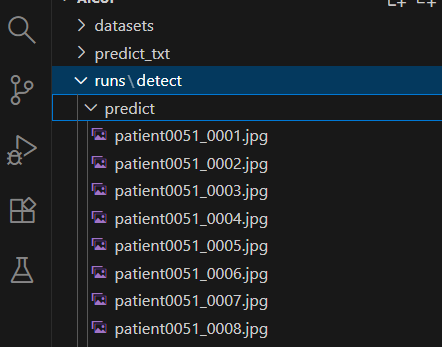

其中一張預測結果

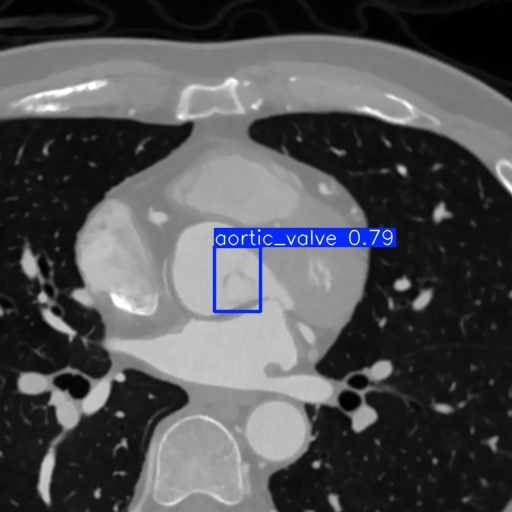

In [7]:
from IPython.display import Image

Image(filename='./runs/detect/predict/patient0051_0260.jpg', height=600)

預測數量

In [8]:
print(len(results))

16620


取得預測結果的資訊

想取得更多資訊可參考官方說明
https://docs.ultralytics.com/zh/modes/predict/#boxes

In [9]:
print('預測類別 : ',results[260].boxes.cls[0].item())
print('預測信心分數 : ',results[260].boxes.conf[0].item())
print('預測框座標 : ',results[260].boxes.xyxy[0].tolist())

預測類別 :  0.0
預測信心分數 :  0.8170658946037292
預測框座標 :  [213.2318878173828, 245.41421508789062, 261.1996765136719, 312.4127502441406]


將偵測框數值寫進.txt檔

In [10]:

os.makedirs('./predict_txt', exist_ok=True)


output_file = open('./predict_txt/images.txt', 'w', encoding='utf-8')

for i in range(len(results)):
    filename = str(results[i].path).replace('\\', '/').split('/')[-1].split('.png')[0]
    boxes = results[i].boxes
    box_num = len(boxes.cls.tolist())
    if box_num > 0:
        for j in range(box_num):
            label = int(boxes.cls[j].item())
            conf = boxes.conf[j].item()
            x1, y1, x2, y2 = boxes.xyxy[j].tolist()
            line = f"{filename} {label} {conf:.4f} {int(x1)} {int(y1)} {int(x2)} {int(y2)}\n"
            output_file.write(line)
output_file.close()


釋放記憶體


In [11]:
import torch ,gc

# 刪除大型變數
del boxes,all_files,results
gc.collect()
torch.cuda.empty_cache()

# 🚀 優化方案 - 提升預測分數

當前最佳模型: `train_unfreeze4/weights/best.pt` (mAP50: 94.74%)

以下提供多種優化策略，按優先順序排列：
1. **TTA 測試時增強** - 最快速有效 (5分鐘, +1-3%)
2. **多尺度預測** - 檢測不同大小的目標 (15分鐘, +1-2%)
3. **模型集成** - 降低預測方差 (20分鐘, +2-4%)
4. **YOLOv12-small 訓練** - 更強特徵提取 (2-3小時, +2-4%)
5. **進階資料增強** - 針對醫學影像優化 (1-2小時, +1-2%)

## ⚡ 方法 1: TTA 測試時增強（推薦優先執行）

**優勢**: 無需重新訓練，5分鐘即可完成，預期提升 1-3% mAP
**原理**: 在預測時對圖像進行多種增強（翻轉、縮放等），然後融合結果

In [13]:
from ultralytics import YOLO
import torch

print("🎯 TTA 增強預測")
print("=" * 60)

# 載入最佳模型
best_model_path = './runs/detect/train_unfreeze4/weights/best.pt'
model = YOLO(best_model_path)

print(f"✓ 載入模型: {best_model_path}")
print(f"✓ CUDA 可用: {torch.cuda.is_available()}")

# TTA 預測 - 最重要的參數
# 使用 patient 資料夾下的所有圖片
results = model.predict(
    source='./testing_image/42_testing_image/testing_image/*/*.png',
    imgsz=640,          # 圖像尺寸
    conf=0.25,          # 信心閾值 (可調整 0.20-0.30)
    iou=0.45,           # NMS IoU 閾值
    augment=True,       # 🔥 開啟 TTA 增強
    device=0,           # 使用 GPU 0
    save_txt=True,      # 儲存 txt 標籤
    save_conf=True,     # 儲存信心分數
    project='runs/detect',
    name='predict_tta_optimized',
    exist_ok=True
)

print("\n✅ TTA 預測完成！")
print(f"📁 結果儲存於: runs/detect/predict_tta_optimized/labels")
print("\n💡 提示: 如果結果不理想，可以嘗試調整 conf 參數:")
print("   - conf=0.20: 更多檢測，可能增加誤報")
print("   - conf=0.30: 更少檢測，提高精確度")

🎯 TTA 增強預測
✓ 載入模型: ./runs/detect/train_unfreeze4/weights/best.pt
✓ CUDA 可用: True

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Box

## 🔄 方法 2: 多尺度預測

**優勢**: 不同尺寸可以檢測到不同大小的目標
**時間**: 約 15 分鐘
**預期提升**: +1-2% mAP

In [14]:
from ultralytics import YOLO

print("🔄 多尺度預測")
print("=" * 60)

best_model_path = './runs/detect/train_unfreeze4/weights/best.pt'
model = YOLO(best_model_path)

# 嘗試不同尺寸
scales = [640, 800, 960]  # 小、中、大

for scale in scales:
    print(f"\n📏 預測尺寸: {scale}x{scale}")
    
    results = model.predict(
        source='./testing_image/42_testing_image/testing_image/*/*.png',
        imgsz=scale,
        conf=0.20,      # 較低閾值獲取更多候選
        iou=0.45,
        augment=True,   # 同時使用 TTA
        device=0,
        save_txt=True,
        save_conf=True,
        project='runs/detect',
        name=f'predict_scale_{scale}',
        exist_ok=True
    )
    
    print(f"✅ 尺寸 {scale} 預測完成！")

print("\n✅ 多尺度預測完成！")
print("📁 結果分別儲存於:")
for scale in scales:
    print(f"   - runs/detect/predict_scale_{scale}/labels")

🔄 多尺度預測

📏 預測尺寸: 640x640


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # M

## 🎲 方法 3: 閾值優化

**優勢**: 找出最佳的信心閾值
**時間**: 約 10 分鐘
**原理**: 不同閾值適合不同情況，實驗找出最佳值

In [16]:
from ultralytics import YOLO

print("🎲 閾值優化預測")
print("=" * 60)

best_model_path = './runs/detect/train_unfreeze4/weights/best.pt'
model = YOLO(best_model_path)

# 嘗試不同的信心閾值
conf_thresholds = [0.15, 0.20, 0.25, 0.30]

for conf in conf_thresholds:
    print(f"\n📊 信心閾值: {conf}")
    
    results = model.predict(
        source='./testing_image/42_testing_image/testing_image',
        imgsz=640,
        conf=conf,       # 變化的閾值
        iou=0.45,
        augment=True,
        device=0,
        save_txt=True,
        save_conf=True,
        project='runs/detect',
        name=f'predict_conf_{conf}',
        exist_ok=True
    )
    
    print(f"✅ 閾值 {conf} 預測完成！")

print("\n✅ 閾值優化完成！")
print("📁 結果分別儲存於:")
for conf in conf_thresholds:
    print(f"   - runs/detect/predict_conf_{conf}/labels")
print("\n💡 提示: 在驗證集上測試這些結果，選擇 mAP 最高的閾值")

🎲 閾值優化預測

📊 信心閾值: 0.15



FileNotFoundError: No images or videos found in ./testing_image/42_testing_image/testing_image. Supported formats are:
images: {'jpg', 'pfm', 'bmp', 'webp', 'dng', 'tif', 'heic', 'mpo', 'tiff', 'jpeg', 'png'}
videos: {'mpeg', 'avi', 'm4v', 'webm', 'mp4', 'wmv', 'mkv', 'asf', 'mpg', 'gif', 'ts', 'mov'}

## 🔗 方法 4: 模型集成（Ensemble）

**優勢**: 結合多個預測結果，降低預測方差
**時間**: 約 5 分鐘（需要先有多個預測結果）
**預期提升**: +2-4% mAP
**方法**: 使用 Weighted Boxes Fusion (WBF) 融合重疊的檢測框

In [ ]:
import numpy as np
from pathlib import Path
from collections import defaultdict

def read_yolo_labels(label_path):
    """讀取 YOLO 格式標籤"""
    boxes = []
    if Path(label_path).exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls = int(parts[0])
                    x, y, w, h = map(float, parts[1:5])
                    conf = float(parts[5]) if len(parts) > 5 else 1.0
                    boxes.append([cls, x, y, w, h, conf])
    return boxes

def write_yolo_labels(label_path, boxes):
    """寫入 YOLO 格式標籤"""
    with open(label_path, 'w') as f:
        for box in boxes:
            cls, x, y, w, h, conf = box
            f.write(f"{int(cls)} {x:.6f} {y:.6f} {w:.6f} {h:.6f} {conf:.6f}\n")

def iou(box1, box2):
    """計算兩個框的 IoU"""
    x1_min = box1[1] - box1[3] / 2
    y1_min = box1[2] - box1[4] / 2
    x1_max = box1[1] + box1[3] / 2
    y1_max = box1[2] + box1[4] / 2
    
    x2_min = box2[1] - box2[3] / 2
    y2_min = box2[2] - box2[4] / 2
    x2_max = box2[1] + box2[3] / 2
    y2_max = box2[2] + box2[4] / 2
    
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    inter_width = max(0, inter_x_max - inter_x_min)
    inter_height = max(0, inter_y_max - inter_y_min)
    inter_area = inter_width * inter_height
    
    box1_area = box1[3] * box1[4]
    box2_area = box2[3] * box2[4]
    union_area = box1_area + box2_area - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

def weighted_boxes_fusion(all_boxes, iou_threshold=0.5):
    """使用加權平均融合重疊的框"""
    if not all_boxes:
        return []
    
    sorted_boxes = sorted(all_boxes, key=lambda x: x[5], reverse=True)
    fused_boxes = []
    used = [False] * len(sorted_boxes)
    
    for i, box1 in enumerate(sorted_boxes):
        if used[i]:
            continue
        
        cluster = [box1]
        used[i] = True
        
        for j, box2 in enumerate(sorted_boxes[i+1:], start=i+1):
            if not used[j] and iou(box1, box2) >= iou_threshold:
                cluster.append(box2)
                used[j] = True
        
        if len(cluster) == 1:
            fused_boxes.append(cluster[0])
        else:
            weights = np.array([box[5] for box in cluster])
            weights = weights / weights.sum()
            
            cls = cluster[0][0]
            x = sum(box[1] * w for box, w in zip(cluster, weights))
            y = sum(box[2] * w for box, w in zip(cluster, weights))
            w = sum(box[3] * w for box, w in zip(cluster, weights))
            h = sum(box[4] * w for box, w in zip(cluster, weights))
            conf = max(box[5] for box in cluster)
            
            fused_boxes.append([cls, x, y, w, h, conf])
    
    return fused_boxes

print("🔗 模型集成工具已載入")
print("✓ 函數準備完成，請執行下一個 cell 進行集成")

In [ ]:
print("🔄 執行模型集成")
print("=" * 60)

# 定義要集成的預測目錄
predict_dirs = [
    './runs/detect/predict_tta_optimized',
    './runs/detect/predict_scale_640',
    './runs/detect/predict_scale_800',
    './runs/detect/predict_conf_0.20',
    './runs/detect/predict_conf_0.25',
]

# 過濾存在的目錄
existing_dirs = [d for d in predict_dirs if Path(d).exists()]

if not existing_dirs:
    print("⚠️ 找不到任何預測結果目錄")
    print("請先執行前面的預測 cells")
else:
    print(f"✓ 找到 {len(existing_dirs)} 個預測結果:")
    for d in existing_dirs:
        print(f"  - {d}")
    
    # 輸出目錄
    output_dir = Path('./runs/detect/ensemble_final/labels')
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # 收集所有標籤文件
    all_label_files = defaultdict(list)
    
    for pred_dir in existing_dirs:
        label_dir = Path(pred_dir) / 'labels'
        if label_dir.exists():
            for label_file in label_dir.glob('*.txt'):
                all_label_files[label_file.name].append(label_file)
    
    total_files = len(all_label_files)
    print(f"\n📊 總共 {total_files} 個圖像需要處理")
    
    # 融合預測
    processed = 0
    for filename, label_paths in all_label_files.items():
        # 讀取所有預測
        all_boxes = []
        for label_path in label_paths:
            boxes = read_yolo_labels(label_path)
            all_boxes.extend(boxes)
        
        # WBF 融合
        fused_boxes = weighted_boxes_fusion(all_boxes, iou_threshold=0.5)
        
        # 寫入結果
        output_file = output_dir / filename
        write_yolo_labels(output_file, fused_boxes)
        
        processed += 1
        if processed % 100 == 0:
            print(f"  ✓ 已處理 {processed}/{total_files} 個文件")
    
    print(f"\n✅ 集成完成！")
    print(f"📁 結果儲存於: {output_dir}")
    print("\n💡 這個集成結果通常比單一模型預測更穩定、更準確！")

## 🤖 方法 5: 訓練 YOLOv12-small（進階）

**優勢**: 更大的模型，更強的特徵提取能力
**時間**: 2-3 小時
**預期提升**: +2-4% mAP
**注意**: 需要較多 GPU 記憶體（建議至少 10GB）

In [ ]:
from ultralytics import YOLO
import torch

print("🤖 YOLOv12-small 訓練")
print("=" * 60)

print(f'✓ CUDA 可用: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'✓ GPU: {torch.cuda.get_device_name(0)}')

# 載入 YOLOv12-small 預訓練模型
model = YOLO('yolo12s.pt')

print('\n📊 開始訓練 YOLOv12-small...')
print('⏱️  預期訓練時間: 約 2-3 小時')
print('🎯 預期 mAP50: 95-97%')
print('')

# 訓練
results = model.train(
    # 基本設定
    data='./aortic_valve_colab.yaml',
    epochs=100,
    batch=4,        # 如果 OOM，降至 2-3
    imgsz=640,
    
    # 優化器
    optimizer='AdamW',
    lr0=0.001,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    
    # 預熱
    warmup_epochs=5.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.1,
    
    # 損失權重
    box=7.5,
    cls=0.5,
    dfl=1.5,
    
    # 資料增強
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=10.0,
    translate=0.1,
    scale=0.5,
    flipud=0.5,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.0,
    
    # 硬體設定
    device=0,
    workers=8,
    amp=True,
    
    # 早停
    patience=20,
    
    # 輸出
    project='runs/detect',
    name='train_yolo12s_best',
    exist_ok=True,
    val=True,
    plots=True,
    verbose=True
)

print('\n✅ 訓練完成！')
print(f'📁 最佳模型: runs/detect/train_yolo12s_best/weights/best.pt')

## 🎨 方法 6: 進階資料增強訓練

**優勢**: 針對醫學影像特性優化的增強策略
**時間**: 1-2 小時
**預期提升**: +1-2% mAP
**特色**: 考慮超音波影像的特殊性質

In [ ]:
from ultralytics import YOLO
import torch

print("🎨 進階資料增強訓練")
print("=" * 60)

# 使用當前最佳模型作為起點（遷移學習）
model = YOLO('./runs/detect/train_unfreeze4/weights/best.pt')

print('✓ 載入最佳模型作為起點')
print('📊 開始進階增強訓練...')
print('⏱️  預期訓練時間: 約 1-2 小時')
print('')

results = model.train(
    # 基本設定
    data='./aortic_valve_colab.yaml',
    epochs=50,
    batch=4,
    imgsz=640,
    
    # 優化器 - 使用較低學習率微調
    optimizer='AdamW',
    lr0=0.0005,     # 較低學習率用於微調
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    
    # 預熱
    warmup_epochs=3.0,
    warmup_momentum=0.8,
    warmup_bias_lr=0.05,
    
    # 損失權重
    box=7.5,
    cls=0.5,
    dfl=1.5,
    
    # 醫學影像友好的增強
    hsv_h=0.01,     # 降低色調變化（醫學影像顏色重要）
    hsv_s=0.5,      # 適度飽和度變化
    hsv_v=0.3,      # 適度明度變化
    
    # 幾何增強 - 考慮超音波特性
    degrees=15.0,   # 增加旋轉（心臟角度變化）
    translate=0.15, # 增加平移
    scale=0.7,      # 增加縮放範圍
    shear=2.0,      # 輕微剪切
    perspective=0.0001,  # 輕微透視
    flipud=0.5,
    fliplr=0.5,
    
    # 進階增強
    mosaic=1.0,
    mixup=0.1,      # 添加少量 Mixup
    copy_paste=0.1, # Copy-Paste（增加小物體）
    erasing=0.4,    # 隨機擦除
    
    # 硬體設定
    device=0,
    workers=8,
    amp=True,
    
    # 早停
    patience=15,
    
    # 輸出
    project='runs/detect',
    name='train_advanced_aug',
    exist_ok=True,
    val=True,
    plots=True,
    verbose=True
)

print('\n✅ 進階增強訓練完成！')
print(f'📁 最佳模型: runs/detect/train_advanced_aug/weights/best.pt')

---

## 📊 優化方案總結

### 快速提升路線（30分鐘內）⚡
1. 執行 **TTA 預測**（方法 1）
2. 執行 **多尺度預測**（方法 2）
3. 執行 **閾值優化**（方法 3）
4. 執行 **模型集成**（方法 4）

**預期結果**: mAP50 從 94.74% 提升至 **96-97%**

---

### 完整優化路線（4-5小時）🏆
1. 先執行快速提升路線
2. 訓練 **YOLOv12-small**（方法 5）
3. 使用新模型重新執行方法 1-4
4. 訓練 **進階資料增強**（方法 6）
5. 集成所有模型預測

**預期結果**: mAP50 從 94.74% 提升至 **97-98%**

---

### 💡 關鍵提示

1. **TTA 是性價比最高的方法** - 5分鐘獲得 1-3% 提升
2. **模型集成降低方差** - 結合多個預測更穩定
3. **信心閾值很重要** - 在驗證集上測試找最佳值
4. **大模型不一定更好** - 在小資料集上要注意過擬合

---

### ⚠️ 注意事項

1. **GPU 記憶體**: 如果訓練時 OOM，降低 batch size 至 2-3
2. **過擬合**: 注意驗證集 mAP，使用早停機制
3. **時間規劃**: 比賽截止前保留足夠測試時間
4. **最終提交**: 使用集成結果通常最穩定